In [236]:
import os, sys
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import importlib.util
import plotly.express as px
from datetime import datetime
# Get current path from where script is executed
if os.name == 'nt':
    sep = '\\'
elif os.name == 'posix':
    sep = '/'
else:
    print(f'What is this OS? {os.name}')

path = os.getcwd()
path_datasets = path[:-len(f'Code{sep}src{sep}project_CSP_MATH_571')] + f'DataSets{sep}weather{sep}'


#MapGenerator Lib
path_maps = path + f'{sep}mapGeneration{sep}mapGeneration.py'
spec = importlib.util.spec_from_file_location("mapGeneration", path_maps)
mp = importlib.util.module_from_spec(spec)
spec.loader.exec_module(mp)


### Load Data 

### The Missing Value in the dataset is denotaed by M and T therefore we replace M and T with "NaN"

In [238]:
# Read csv
datasets = os.listdir(path_datasets)

df_list = []
for dataset in datasets:
    if dataset[-4:] == '.csv':
        df = pd.read_csv(path_datasets + dataset, index_col=None, header=0, na_values=['M','T'])
        df_list.append(df)


# Merge Taxis Data
df = pd.concat(df_list, axis=0, ignore_index=True)

del(df_list)

df.head()

,station,valid,tmpf,relh,drct,sknt,p01m,skyc1
0,ORD,2017-01-01 00:51,23.0,84.39,250.0,4.0,0.0,CLR
1,ORD,2017-01-01 01:51,21.0,84.62,0.0,0.0,0.0,CLR
2,ORD,2017-01-01 02:51,21.0,87.97,210.0,4.0,0.0,CLR
3,ORD,2017-01-01 03:51,19.0,87.87,190.0,5.0,0.0,CLR
4,ORD,2017-01-01 04:51,21.0,87.97,200.0,4.0,0.0,CLR


### Shape of Dataset

In [239]:
df.shape

(34278, 8)

###  Datatype in the coloums

In [240]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34278 entries, 0 to 34277
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   station  34278 non-null  object 
 1   valid    34278 non-null  object 
 2   tmpf     32575 non-null  float64
 3   relh     32476 non-null  float64
 4   drct     33885 non-null  float64
 5   sknt     34212 non-null  float64
 6   p01m     28725 non-null  float64
 7   skyc1    34251 non-null  object 
dtypes: float64(5), object(3)
memory usage: 2.1+ MB


In [241]:
for col in df.columns: 
    print(col) 

station
valid
tmpf
relh
drct
sknt
p01m
skyc1


### Renaming Columns

In [242]:
df = df.rename(columns={"valid": "datetime","tmpf": "temperature", "relh":"relative_humidity","drct": "wind_direction","sknt":"wind_speed",
                "p01m":"precipitation","skyc1":"sky_level"})

### Convert into datetime format

In [243]:
df['datetime'] =  pd.to_datetime(df['datetime'], format=r"%Y-%m-%d %H:%M")

In [244]:
df

,station,datetime,temperature,relative_humidity,wind_direction,wind_speed,precipitation,sky_level
0,ORD,2017-01-01 00:51:00,23.0,84.39,250.0,4.0,0.0,CLR
1,ORD,2017-01-01 01:51:00,21.0,84.62,0.0,0.0,0.0,CLR
2,ORD,2017-01-01 02:51:00,21.0,87.97,210.0,4.0,0.0,CLR
3,ORD,2017-01-01 03:51:00,19.0,87.87,190.0,5.0,0.0,CLR
4,ORD,2017-01-01 04:51:00,21.0,87.97,200.0,4.0,0.0,CLR
...,...,...,...,...,...,...,...,...
34273,ORD,2019-12-30 21:51:00,27.0,88.65,230.0,19.0,NaN,SCT
34274,ORD,2019-12-30 22:23:00,27.0,84.66,240.0,14.0,NaN,SCT
34275,ORD,2019-12-30 22:33:00,27.0,84.66,240.0,19.0,NaN,SCT
34276,ORD,2019-12-30 22:51:00,27.0,80.83,240.0,20.0,NaN,BKN


### Count of missing value

In [245]:
 df.isna().sum()

station                 0
datetime                0
temperature          1703
relative_humidity    1802
wind_direction        393
wind_speed             66
precipitation        5553
sky_level              27
dtype: int64

### Plot the missing value

In [246]:
def plotmissing(col, time='M', fromDate=None, toDate=None, hist=False):
    # Randomly group by start timestamp
    df.index = df['datetime']
    # Total elements
    df_plot = df
    
    if fromDate is not None:
        df_plot = df_plot.loc[df_plot['datetime']>fromDate]      
    if toDate is not None:
        df_plot = df_plot.loc[df_plot['datetime']<toDate]  
        
    timeStart_grouped = df_plot[col].groupby(pd.Grouper(freq=time))
    # Total NA elements
    timeStart_tollNA_grouped = df_plot.loc[df_plot[col].isna(),].groupby(pd.Grouper(freq=time))

    y = 100 * timeStart_tollNA_grouped.size()/timeStart_grouped.size()

    # Plot
    plt.figure(figsize=(10,5))
    plt.fill_between(y.index, y, color='blue', alpha=0.5)
    plt.plot(y, color='red')
    plt.grid()
    plt.xticks(rotation=25, ha='right')
    plt.xlabel('Date')
    plt.ylabel('% of missing NA ')

    plt.show()

### Missing % of NA in temperature column

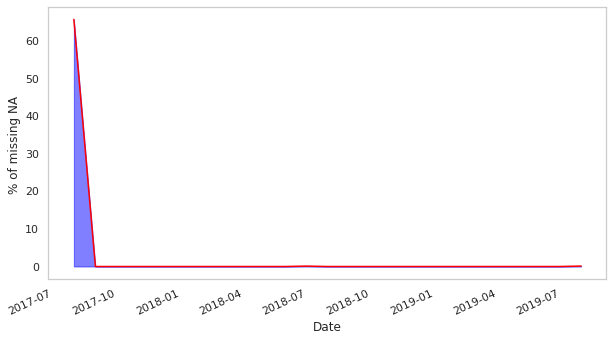

In [247]:
plotmissing('temperature')

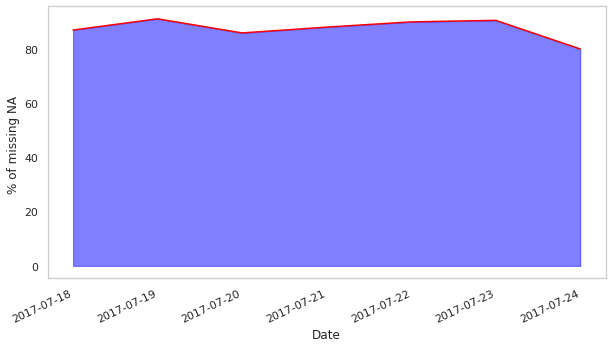

In [248]:
plotmissing('temperature', time='D', toDate=pd.to_datetime(r'2018-05', format='%Y-%m'))

### Plot temperature

### We can see clearly  pattern and cycle in temperature every year

In [249]:
temperaturefig = px.line(df, x='datetime', y='temperature')
temperaturefig.show()

### Fill the missing value with last known value

In [250]:
df.loc[df['temperature'].isna()]

,station,datetime,temperature,relative_humidity,wind_direction,wind_speed,precipitation,sky_level
datetime,,,,,,,,
2017-07-18 11:00:00,ORD,2017-07-18 11:00:00,NaN,NaN,0.0,0.0,NaN,CLR
2017-07-18 11:05:00,ORD,2017-07-18 11:05:00,NaN,NaN,240.0,5.0,NaN,CLR
2017-07-18 11:10:00,ORD,2017-07-18 11:10:00,NaN,NaN,280.0,5.0,NaN,CLR
2017-07-18 11:15:00,ORD,2017-07-18 11:15:00,NaN,NaN,290.0,5.0,NaN,CLR
2017-07-18 11:20:00,ORD,2017-07-18 11:20:00,NaN,NaN,270.0,4.0,NaN,CLR
...,...,...,...,...,...,...,...,...
2017-07-24 09:00:00,ORD,2017-07-24 09:00:00,NaN,NaN,NaN,NaN,NaN,BKN
2017-07-24 09:05:00,ORD,2017-07-24 09:05:00,NaN,NaN,NaN,NaN,NaN,BKN
2017-07-24 09:10:00,ORD,2017-07-24 09:10:00,NaN,NaN,20.0,16.0,NaN,BKN


### Looking carefully at the dataset, most of  the missing value have gap of 5 min or 10 mins. Therefore I have decided to copy the value of the last known temprature and give it to the subsequent unknow value. In case the gap between the missing value or the  subsequent unknow is more than 2hrs we drop the those missing value row. 

In [251]:
def fill(x,y):
    
    list1=[]
    l=len(x)
    for i in range(l):
        
        if(pd.notna(x.iloc[i])):

            t=x.iloc[i]
            start=y.iloc[i]
        else:
            end=y.iloc[i]
            s2=end-start
            s2=s2.total_seconds()


            if (s2<=7200):
                x.iloc[i]=t
            else:
                list1.append(i)
#Drop the rows who have gap of more than 2 hours   
    df.drop(df.index[[*list1]],inplace=True)         
            

### Fill the missing value in temperature

In [252]:
fill(df['temperature'],df['datetime'])

/home/humblebee/anaconda3/envs/fastai3/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### All the missing value in temperature

In [253]:
df['temperature'].isna().sum()

0

In [254]:
# fig = px.line(df, x='datetime', y='temperature')
# fig.show()

### Plotting missing value of relative humidity

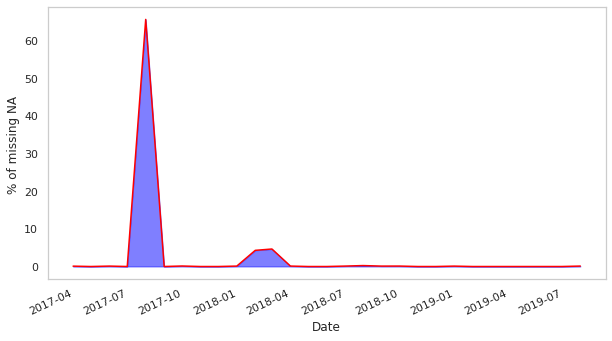

In [255]:
plotmissing('relative_humidity')

### Plotting relative humidity

In [256]:
fig = px.line(df, x='datetime', y='relative_humidity')
fig.show()

### Fill missing value of relative humidity

In [257]:
fill(df['relative_humidity'],df['datetime'])

### Checking for missing value

In [258]:
df['relative_humidity'].isna().sum()


0

In [259]:
df

,station,datetime,temperature,relative_humidity,wind_direction,wind_speed,precipitation,sky_level
datetime,,,,,,,,
2017-01-01 00:51:00,ORD,2017-01-01 00:51:00,23.0,84.39,250.0,4.0,0.0,CLR
2017-01-01 01:51:00,ORD,2017-01-01 01:51:00,21.0,84.62,0.0,0.0,0.0,CLR
2017-01-01 02:51:00,ORD,2017-01-01 02:51:00,21.0,87.97,210.0,4.0,0.0,CLR
2017-01-01 03:51:00,ORD,2017-01-01 03:51:00,19.0,87.87,190.0,5.0,0.0,CLR
2017-01-01 04:51:00,ORD,2017-01-01 04:51:00,21.0,87.97,200.0,4.0,0.0,CLR
...,...,...,...,...,...,...,...,...
2019-12-30 21:51:00,ORD,2019-12-30 21:51:00,27.0,88.65,230.0,19.0,NaN,SCT
2019-12-30 22:23:00,ORD,2019-12-30 22:23:00,27.0,84.66,240.0,14.0,NaN,SCT
2019-12-30 22:33:00,ORD,2019-12-30 22:33:00,27.0,84.66,240.0,19.0,NaN,SCT


### Plot missing value of wind direction

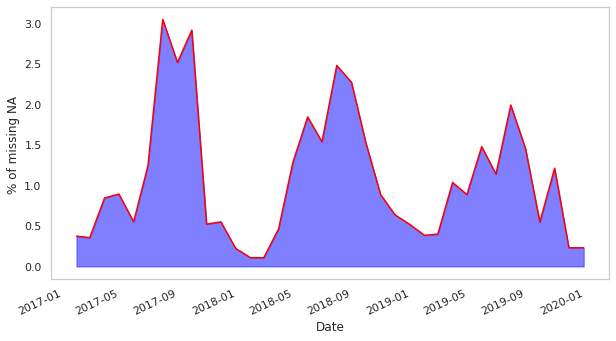

In [260]:
plotmissing('wind_direction')

### Fill missing value of wind direction

In [261]:
fill(df['wind_direction'],df['datetime'])

In [262]:
fig = px.line(df, x='datetime', y='wind_direction')
fig.show()

### Plot missing value of Wind Speed

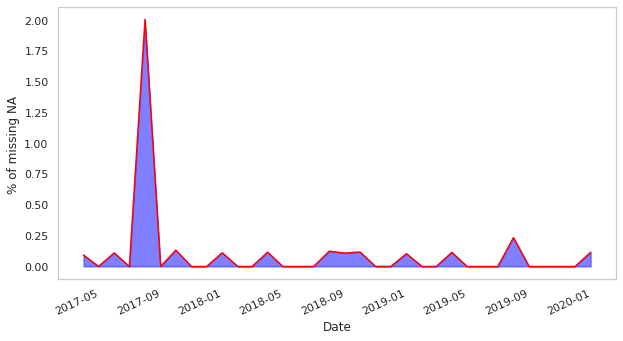

In [263]:
plotmissing('wind_speed')

### Plot Wind direction 

In [264]:
fig = px.line(df, x='datetime', y='wind_speed')
fig.show()

### Fill missing value

In [265]:
fill(df['wind_speed'],df['datetime'])

### Plot wind speed after filling missing value

In [266]:
fig = px.line(df, x='datetime', y='wind_speed')
fig.show()

### Plot missing value of precipitation

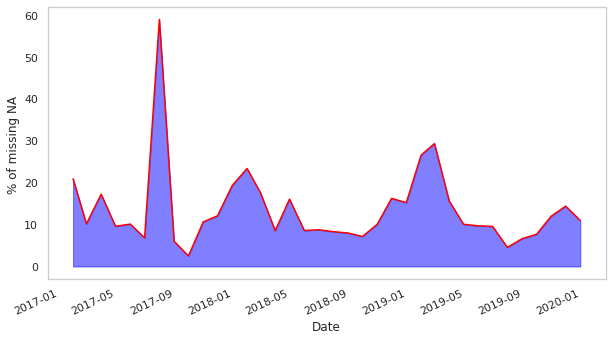

In [267]:
plotmissing('precipitation')

### Plot the precipitation

In [268]:
fig = px.line(df, x='datetime', y='precipitation')
fig.show()

### Fill the missing value

In [269]:
fill(df['precipitation'],df['datetime'])

In [270]:
df['precipitation'].isna().sum()

0

### missing value in sky level

In [271]:
df

,station,datetime,temperature,relative_humidity,wind_direction,wind_speed,precipitation,sky_level
datetime,,,,,,,,
2017-01-01 00:51:00,ORD,2017-01-01 00:51:00,23.0,84.39,250.0,4.0,0.00,CLR
2017-01-01 01:51:00,ORD,2017-01-01 01:51:00,21.0,84.62,0.0,0.0,0.00,CLR
2017-01-01 02:51:00,ORD,2017-01-01 02:51:00,21.0,87.97,210.0,4.0,0.00,CLR
2017-01-01 03:51:00,ORD,2017-01-01 03:51:00,19.0,87.87,190.0,5.0,0.00,CLR
2017-01-01 04:51:00,ORD,2017-01-01 04:51:00,21.0,87.97,200.0,4.0,0.00,CLR
...,...,...,...,...,...,...,...,...
2019-12-30 17:16:00,ORD,2019-12-30 17:16:00,28.9,89.12,230.0,17.0,0.25,SCT
2019-12-30 17:40:00,ORD,2019-12-30 17:40:00,28.9,89.12,240.0,15.0,0.25,SCT
2019-12-30 17:51:00,ORD,2019-12-30 17:51:00,30.0,81.40,230.0,17.0,0.25,SCT


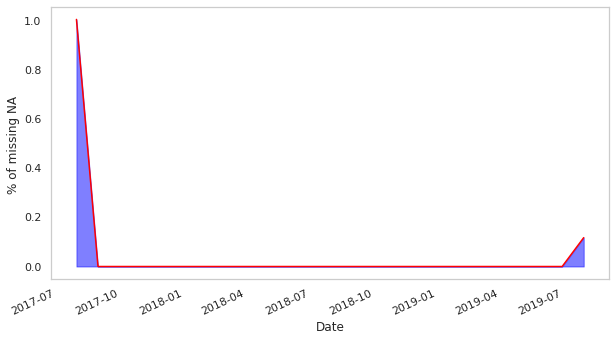

In [272]:
plotmissing('sky_level')

In [273]:

# ASOS Measured Human ASOS
# Amount in % Equivalent Report
# of sky cover in oktas
# 00 to < 05 0 CLR
# > 05 to < 25 > 0 to 2/8 FEW
# > 25 to < 50 > 2/8 to < 4/8 SCT
# > 50 to < 87 > 4/8 to < 8/8 BKN
# > 87 to 100 8/8 OVC

### Plot sky value

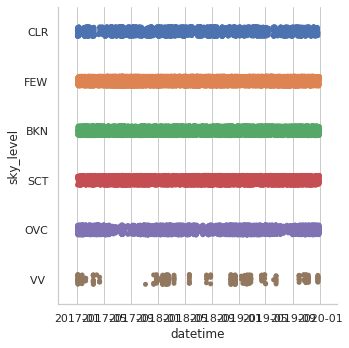

In [274]:
sns.catplot(x="datetime", y="sky_level", data=df)

###  No of null values in sky level

In [275]:
df['sky_level'].isna().sum()

27

### Fill Missing value

In [276]:
fill(df['sky_level'],df['datetime'])

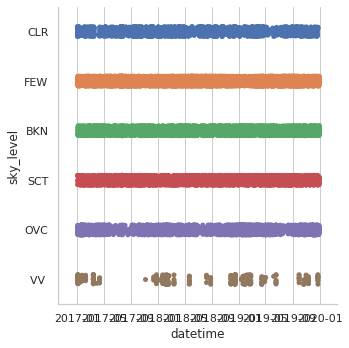

In [277]:
sns.catplot(x="datetime", y="sky_level", data=df)

In [278]:
df

,station,datetime,temperature,relative_humidity,wind_direction,wind_speed,precipitation,sky_level
datetime,,,,,,,,
2017-01-01 00:51:00,ORD,2017-01-01 00:51:00,23.0,84.39,250.0,4.0,0.00,CLR
2017-01-01 01:51:00,ORD,2017-01-01 01:51:00,21.0,84.62,0.0,0.0,0.00,CLR
2017-01-01 02:51:00,ORD,2017-01-01 02:51:00,21.0,87.97,210.0,4.0,0.00,CLR
2017-01-01 03:51:00,ORD,2017-01-01 03:51:00,19.0,87.87,190.0,5.0,0.00,CLR
2017-01-01 04:51:00,ORD,2017-01-01 04:51:00,21.0,87.97,200.0,4.0,0.00,CLR
...,...,...,...,...,...,...,...,...
2019-12-30 17:16:00,ORD,2019-12-30 17:16:00,28.9,89.12,230.0,17.0,0.25,SCT
2019-12-30 17:40:00,ORD,2019-12-30 17:40:00,28.9,89.12,240.0,15.0,0.25,SCT
2019-12-30 17:51:00,ORD,2019-12-30 17:51:00,30.0,81.40,230.0,17.0,0.25,SCT


In [279]:
df['temperature'] = pd.to_numeric(df['temperature'])
df['relative_humidity'] = pd.to_numeric(df['relative_humidity'])
df['wind_direction'] = pd.to_numeric(df['wind_direction'])
df['wind_speed'] = pd.to_numeric(df['wind_speed'])
df['precipitation'] = pd.to_numeric(df['precipitation'])




In [280]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 33135 entries, 2017-01-01 00:51:00 to 2019-12-30 19:51:00
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   station            33135 non-null  object        
 1   datetime           33135 non-null  datetime64[ns]
 2   temperature        33135 non-null  float64       
 3   relative_humidity  33135 non-null  float64       
 4   wind_direction     33135 non-null  float64       
 5   wind_speed         33135 non-null  float64       
 6   precipitation      33135 non-null  float64       
 7   sky_level          33135 non-null  object        
dtypes: datetime64[ns](1), float64(5), object(2)
memory usage: 3.5+ MB


In [281]:
import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)

### Boxplot of all the features

We have some outliers in temprature. After referring to outside source we found that the outlier are real value and are not errors.

https://weatherspark.com/y/14091/Average-Weather-in-Chicago-Illinois-United-States-Year-Round

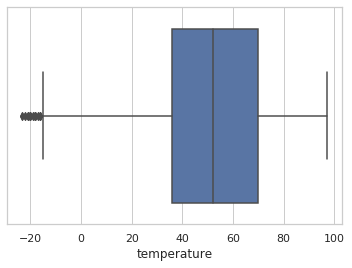

In [282]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['temperature'])

In [283]:
df['temperature'].sort_values()

datetime
2019-01-30 07:51:00   -23.1
2019-01-30 06:51:00   -23.1
2019-01-30 08:51:00   -22.0
2019-01-30 05:51:00   -22.0
2019-01-30 09:51:00   -20.9
                       ... 
2018-06-29 14:51:00    95.0
2018-05-27 14:51:00    95.0
2018-05-27 16:51:00    95.0
2018-08-04 13:51:00    96.1
2018-05-27 15:51:00    97.0
Name: temperature, Length: 33135, dtype: float64

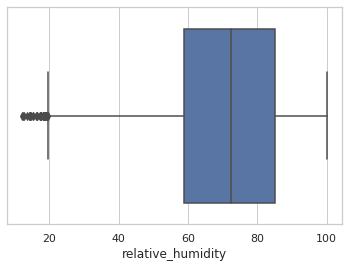

In [284]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['relative_humidity'])

### The outlier values of relative humidity are real value not errors.
https://wgntv.com/weather/weather-blog/how-dry-i-am-chicago-set-record-for-all-time-lowest-humidity-breaking-85-year-old-record/

In [285]:
df['relative_humidity'].sort_values()

datetime
2019-04-20 13:51:00     12.23
2019-04-20 15:51:00     12.30
2019-04-20 14:51:00     12.73
2019-04-20 16:51:00     13.43
2018-04-30 15:51:00     14.19
                        ...  
2019-02-07 02:51:00    100.00
2018-04-18 21:39:00    100.00
2018-04-18 20:51:00    100.00
2018-12-01 22:16:00    100.00
2018-12-14 21:18:00    100.00
Name: relative_humidity, Length: 33135, dtype: float64

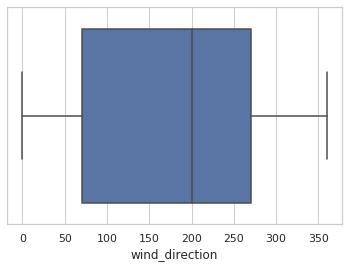

In [286]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['wind_direction'])

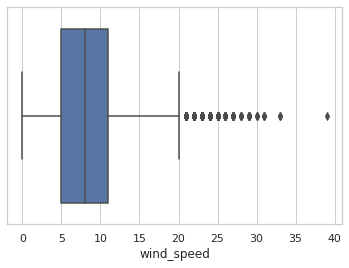

In [287]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['wind_speed'])

### The outlier are real values not errors.

In [288]:
df['wind_speed'].sort_values(ascending=False)

datetime
2019-06-30 13:54:00    39.0
2017-10-14 19:58:00    33.0
2018-11-26 00:51:00    33.0
2019-06-30 14:01:00    33.0
2017-10-14 19:56:00    31.0
                       ... 
2019-10-26 06:51:00     0.0
2018-11-15 11:51:00     0.0
2018-11-15 11:23:00     0.0
2018-11-15 11:01:00     0.0
2018-03-18 00:51:00     0.0
Name: wind_speed, Length: 33135, dtype: float64

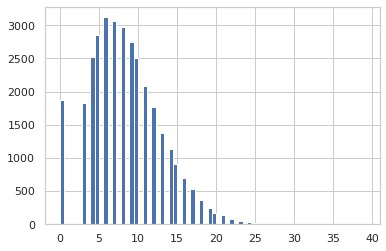

In [289]:
hist = df['wind_speed'].hist(bins=70)   

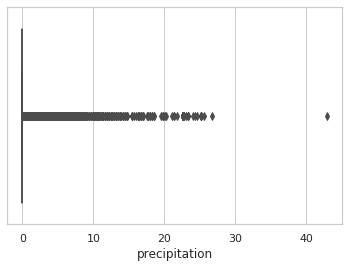

In [290]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['precipitation'])

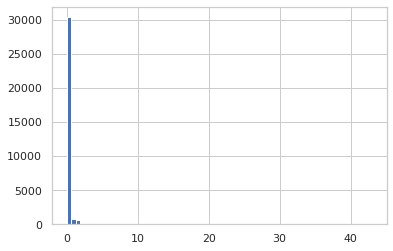

In [291]:
hist = df['precipitation'].hist(bins=70)      

In [292]:
df['precipitation'].sort_values(ascending=False)

datetime
2018-08-07 15:51:00    42.93
2019-10-02 23:51:00    26.67
2018-08-07 15:43:00    25.65
2019-05-27 14:48:00    25.15
2019-05-27 14:51:00    25.15
                       ...  
2018-10-31 06:51:00     0.00
2018-10-31 07:51:00     0.00
2018-10-31 08:51:00     0.00
2018-10-31 09:51:00     0.00
2017-01-01 00:51:00     0.00
Name: precipitation, Length: 33135, dtype: float64

### The precipitation values have many error values

In [293]:
mask = (df['datetime'] > "2018-08-07 12:51:00") & (df['datetime'] <= "2018-08-07 20:51:00")

In [294]:
df.loc[mask].head(50)

,station,datetime,temperature,relative_humidity,wind_direction,wind_speed,precipitation,sky_level
datetime,,,,,,,,
2018-08-07 13:51:00,ORD,2018-08-07 13:51:00,80.1,64.14,240.0,5.0,0.00,FEW
2018-08-07 14:14:00,ORD,2018-08-07 14:14:00,80.1,64.14,330.0,5.0,0.00,FEW
2018-08-07 14:51:00,ORD,2018-08-07 14:51:00,75.0,87.68,20.0,12.0,0.00,SCT
2018-08-07 15:39:00,ORD,2018-08-07 15:39:00,72.0,93.43,10.0,10.0,16.26,OVC
2018-08-07 15:43:00,ORD,2018-08-07 15:43:00,71.1,93.40,10.0,5.0,25.65,VV
2018-08-07 15:51:00,ORD,2018-08-07 15:51:00,71.1,96.32,50.0,6.0,42.93,VV
2018-08-07 15:53:00,ORD,2018-08-07 15:53:00,71.1,96.32,50.0,5.0,3.81,VV
2018-08-07 16:01:00,ORD,2018-08-07 16:01:00,71.1,96.32,80.0,9.0,6.60,VV
2018-08-07 16:09:00,ORD,2018-08-07 16:09:00,71.1,93.40,60.0,9.0,12.45,BKN


In [295]:
mask = (df['datetime'] > "2019-10-02 15:51:00 ") & (df['datetime'] <= "2019-10-03 04:51:00")

In [296]:
df.loc[mask].head(50)

,station,datetime,temperature,relative_humidity,wind_direction,wind_speed,precipitation,sky_level
datetime,,,,,,,,
2019-10-02 16:51:00,ORD,2019-10-02 16:51:00,59.0,96.13,10.0,13.0,0.00,OVC
2019-10-02 17:51:00,ORD,2019-10-02 17:51:00,59.0,93.07,10.0,12.0,0.51,OVC
2019-10-02 18:51:00,ORD,2019-10-02 18:51:00,57.9,96.81,40.0,4.0,0.51,OVC
2019-10-02 19:48:00,ORD,2019-10-02 19:48:00,57.2,100.00,10.0,6.0,0.25,OVC
2019-10-02 19:51:00,ORD,2019-10-02 19:51:00,57.9,96.81,360.0,6.0,0.25,OVC
2019-10-02 19:59:00,ORD,2019-10-02 19:59:00,57.9,96.81,360.0,7.0,0.00,OVC
2019-10-02 20:39:00,ORD,2019-10-02 20:39:00,59.0,96.13,40.0,7.0,0.00,OVC
2019-10-02 20:51:00,ORD,2019-10-02 20:51:00,60.1,96.15,20.0,9.0,0.00,OVC
2019-10-02 21:51:00,ORD,2019-10-02 21:51:00,60.1,96.15,40.0,9.0,0.00,OVC


### The max precipitation each year is given below therefore any value greater than this must be error.

###3.45	October 26, 2019
###2.37	June 21, 
###5.11	October 14, 2017

In [297]:
 df['precipitation'].sort_values(ascending=False).head()

datetime
2018-08-07 15:51:00    42.93
2019-10-02 23:51:00    26.67
2018-08-07 15:43:00    25.65
2019-05-27 14:48:00    25.15
2019-05-27 14:51:00    25.15
Name: precipitation, dtype: float64

###  I have decided to copy the value of the last valid value of precipitation and give it to the error value. In case the gap between the valid value of precipitation or the error value is more than 2hrs we drop the those error value row. 

##### Preprocessing for year 2017

In [298]:
l=len(df['precipitation'])
list1=[]
for i in range(l):
    
    if(df['precipitation'].iloc[i]<=5.11):
        
        if (df['datetime'].iloc[i]<=datetime(2017,12,31)):
            t=df['precipitation'].iloc[i]
            start=df['datetime'].iloc[i]
    elif((df['precipitation'].iloc[i]>=5.11)):
        
        if((df['datetime'].iloc[i]<=datetime(2017,12,31))):
            end=df['datetime'].iloc[i]
            s2=end-start
            s2=s2.total_seconds()
            if (s2<=7200):
                df['precipitation'].iloc[i]=t
            else:
                
                list1.append(i)
#Drop the rows who have gap of more than 2 hours   
df.drop(df.index[[*list1]],inplace=True)     
            

/home/humblebee/anaconda3/envs/fastai3/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### Preprocessing for year 2018

In [299]:
list1=[]
for i in range(l):
    
    if(df['precipitation'].iloc[i]<=2.37):
        
        if ((df['datetime'].iloc[i]>=(datetime(2018,1,1))) & (df['datetime'].iloc[i]<=datetime(2018,12,31))):
            
            t=df['precipitation'].iloc[i]
            start=df['datetime'].iloc[i]
    elif((df['precipitation'].iloc[i]>=2.37)):
        if ((df['datetime'].iloc[i]>=(datetime(2018,1,1))) & (df['datetime'].iloc[i]<=datetime(2018,12,31))):
            end=df['datetime'].iloc[i]
            s2=end-start
            s2=s2.total_seconds()
            if (s2<=7200):
                df['precipitation'].iloc[i]=t
            else:
                list1.append(i)
#Drop the rows who have gap of more than 2 hours   
df.drop(df.index[[*list1]],inplace=True)     
    

##### Preprocessing for year 2019

In [300]:
list2=[]
l=len(df['precipitation'])
for i in range(l):
    if(df['precipitation'].iloc[i]<=3.45):
        
        if ((df['datetime'].iloc[i]>=(datetime(2019,1,1))) & (df['datetime'].iloc[i]<=datetime(2019,12,31))):
            
            t=df['precipitation'].iloc[i]
            start=df['datetime'].iloc[i]
    elif((df['precipitation'].iloc[i]>=3.45)):
        if ((df['datetime'].iloc[i]>=(datetime(2019,1,1))) & (df['datetime'].iloc[i]<=datetime(2019,12,31))):
            end=df['datetime'].iloc[i]
            s2=end-start
            s2=s2.total_seconds()
            if (s2<=7200):
                df['precipitation'].iloc[i]=t
            else:
                list2.append(i)
#Drop the rows who have gap of more than 2 hours   
df.drop(df.index[[*list2]],inplace=True)  
    

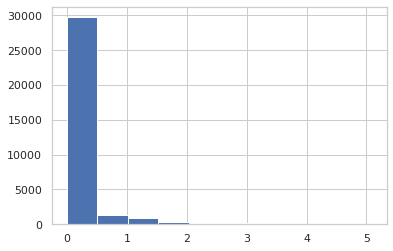

In [301]:
hist = df['precipitation'].hist(bins=10)     

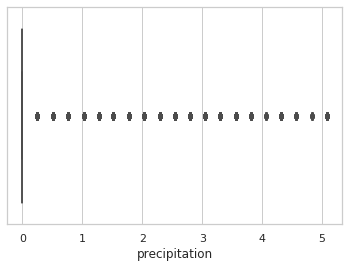

In [302]:
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['precipitation'])

In [303]:
df['precipitation'].sort_values(ascending=False)

datetime
2017-03-30 12:25:00    5.08
2017-03-30 12:51:00    5.08
2017-07-12 08:58:00    5.08
2017-03-26 07:51:00    5.08
2017-02-07 07:14:00    5.08
                       ... 
2018-10-31 06:39:00    0.00
2018-10-31 06:51:00    0.00
2018-10-31 07:51:00    0.00
2018-10-31 08:51:00    0.00
2017-01-01 00:51:00    0.00
Name: precipitation, Length: 33097, dtype: float64